Untitled Plotting Software (UPS-MaP)
==============================
Patrick Irving, 5/19/2021

## Vision:
To enable fast and easy exploration of MaP experimental data.

Possible Names:
* PlotMapper
* MaP-ExPloRS (MaP data exploration and plotting on RNA Structures)
* MaPplotlib (play on matplotlib, the most popular python library for plotting)

## Motivation

* Weeks Lab GitHub has many highly specialized scripts.
  * plotting
  * filtering
  * file conversion
  * clipping structure cassettes
  * analysis
* If you know what you want ahead of time, you can create a nice figure.
* Data exploration is made difficult with the creation of many files, with increasingly long names to distinguish them.

## Solution: Jupyter Notebooks and plotmapper.py
plotmapper.py can be found in the [JNBTools repo on Github](https://github.com/Weeks-UNC/JNBTools).

### Filtering:
- Fits data by sequence
  - no more clipping/padding for structure cassettes
  - not limited to structure cassettes
- Filter by any column in your data tables
  * Statistic, Z-score, Percentile, Deletion Rate, Read Depth, etc.
- Filter by contact distances
- Filter by 3-D distances

### Plotting Tools:
- ShapeMapper QC data
  - mutations per molecule
  - read length distribution
  - reactivity boxplots
- 1-D Reactivity data: SHAPE-MaP, DANCE-MaP, (Frag-JuMP coming soon)
  - Classic ShapeMapper Plots
  - Skyline Plots
  - Arc Plots
  - Linear regression
  - Coloring of nucleotides on secondary and 3-D structures
- 2-D correlation data: Rings, Pairs, and Deletions
  - Heatmap & Contour Plots
  - Arc Plots
  - Secondary Structures
  - 3-Dimensional Structures

### Installation is simple
I'm happy to help with this. Also, the Weeks/Laederach software group is planning a meeting on setting up environments.

First option, work on your own PC:
* Install Anaconda.
* Optionally biopython and py3Dmol.
* Install JNBTools and add to your python path.

Second option, work on Longleaf:
* Clone JNBTools and add to your python path.
* Optionally do the same with biopython and py3Dmol.
* Open a remote Jupyter Notebook using OpenOnDemand.

Notebook Setup
----------------------
The first code cell of a notebook should define defaults and load in modules

For high-level plotting functions, you only need to import plotmapper. However, you will need several packages installed in your python environment:
* matplotlib (mandatory)
* pandas     (mandatory)
* Numpy      (mandatory)
* Biopython  (for analyzing PDB files)
* py3Dmol    (for plotting on 3D models)

In [1]:
# Display plots in-line
%matplotlib inline

# import modules
import plotmapper as MaP
import matplotlib.pyplot as plt

Initializing MaP.Sample
-----------------------
MaP.Sample is the core object in this package. For each MaP experimental sample, it holds the following information.
* Sample name
* Base-pairing information (.ct)
* Secondary Structure (.xrna, .varna, .cte, .nsd)
* Tertiary Structure (.pdb)
  * requires PDB entry name
* ShapeMapper Log file
* ShapeMapper Profile
* RingMapper data
* PairMapper data
* DANCE-MaP reactivities
* SHAPE-JuMP deletions data
  * requires a reference fasta file

In [2]:
example1 = MaP.Sample(sample="example1",
                      profile = 'data/example1_rnasep_profile.txt',
                      ct = 'data/RNaseP.ct',
                      ss = 'data/RC_CRYSTAL_STRUCTURE.xrna',
                      rings = 'data/example1-rnasep.corrs',
                      pairs = 'data/example1-rnasep-pairmap.txt',
                      log = 'data/example1_shapemapper_log.txt',
                      dance_reactivities = 'data/example1_rnasep-reactivities.txt',
                      deletions = 'data/example-rnasep-deletions.txt',
                      fasta = 'data/RNaseP-noSC.fasta',
                      pdb = 'data/3dhs_Correct.pdb',
                      pdb_name = '3dhs')
example2 = MaP.Sample(sample="example2",
                      profile = 'data/example2_rnasep_profile.txt',
                      ct = 'data/RNaseP.ct',
                      ss = 'data/RC_CRYSTAL_STRUCTURE.xrna',
                      rings = 'data/example2-rnasep.corrs',
                      pairs = 'data/example2-rnasep-pairmap.txt',
                      log = 'data/example2_shapemapper_log.txt',
                      dance_reactivities = 'data/example2_rnasep-reactivities.txt',
                      deletions = 'data/example-rnasep-deletions.txt',
                      fasta = 'data/RNaseP-noSC.fasta',
                      pdb = 'data/3dhs_Correct.pdb',
                      pdb_name = '3dhs')

In [3]:
example3 = MaP.Sample(sample="example3",
                      profile = 'data/example3_rnasep_profile.txt',
                      ct = 'data/RNaseP.ct',
                      ss = 'data/RC_CRYSTAL_STRUCTURE.xrna',
                      rings = 'data/example3-rnasep.corrs',
                      pairs = 'data/example3-rnasep-pairmap.txt',
                      log = 'data/example3_shapemapper_log.txt',
                      dance_reactivities = 'data/example3_rnasep-reactivities.txt',
                      deletions = 'data/example-rnasep-deletions.txt',
                      fasta = 'data/RNaseP-noSC.fasta',
                      pdb = 'data/3dhs_Correct.pdb',
                      pdb_name = '3dhs')
example4 = MaP.Sample(sample="example4",
                      profile = 'data/example4_rnasep_profile.txt',
                      ct = 'data/RNaseP.ct',
                      ss = 'data/RC_CRYSTAL_STRUCTURE.xrna',
                      rings = 'data/example4-rnasep.corrs',
                      pairs = 'data/example4-rnasep-pairmap.txt',
                      log = 'data/example4_shapemapper_log.txt',
                      dance_reactivities = 'data/example4_rnasep-reactivities.txt',
                      deletions = 'data/example-rnasep-deletions.txt',
                      fasta = 'data/RNaseP-noSC.fasta',
                      pdb = 'data/3dhs_Correct.pdb',
                      pdb_name = '3dhs')

```python
path = 'data/'
def kwargs(sample):
    kwargs = {"sample":    sample
              "profile":   path+sample+"_rnasep_profile.txt",
              "ct":        path+"RNaseP.ct",
              "ss":        path+"RC_CRYSTAL_STRUCTURE.xrna",
              "rings":     path+sample+"-rnasep.corrs",
              "pairs":     path+sample+"-rnasep-pairmap.txt",
              "log":       path+sample+"_shapemapper_log.txt",
              "dance_reactivities": path+sample+"_rnasep-reactivities.txt",
              "deletions": path+"example-rnasep-deletions.txt",
              "fasta":     path+"RNaseP-noSC.fasta",
              "pdb":       path+"3dhs_Correct.pdb",
              "pdb_name":  "3dhs"}
    return kwargs

example1 = MaP.Sample(**kwargs("example1"))
example2 = MaP.Sample(**kwargs("example2"))
example3 = MaP.Sample(**kwargs("example3"))
example4 = MaP.Sample(**kwargs("example4"))
```

High-level plottting functions
-----------------------------------------

## ShapeMapper QC
* make_log_qc (high-level function)
  * plot_log_MutsPerMol
  * set_log_MutsPerMol
  * make_log_MutsPerMol
  * plot_log_ReadLength
  * set_log_ReadLength
  * make_log_ReadLength
  * get_boxplot_data
  * plot_boxplot
* array_qc

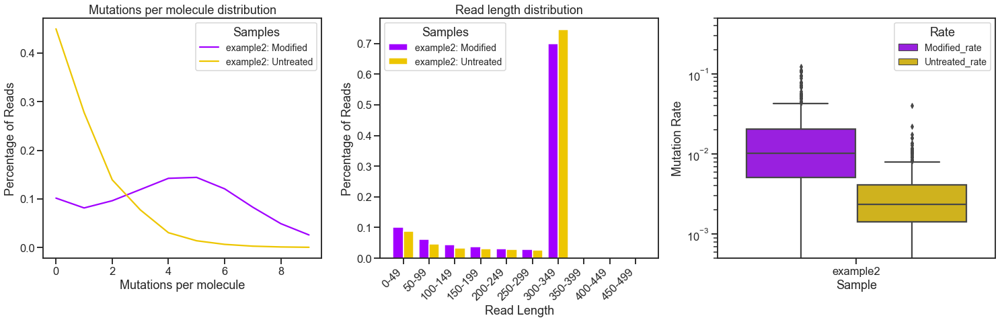

In [4]:
example2.make_log_qc()

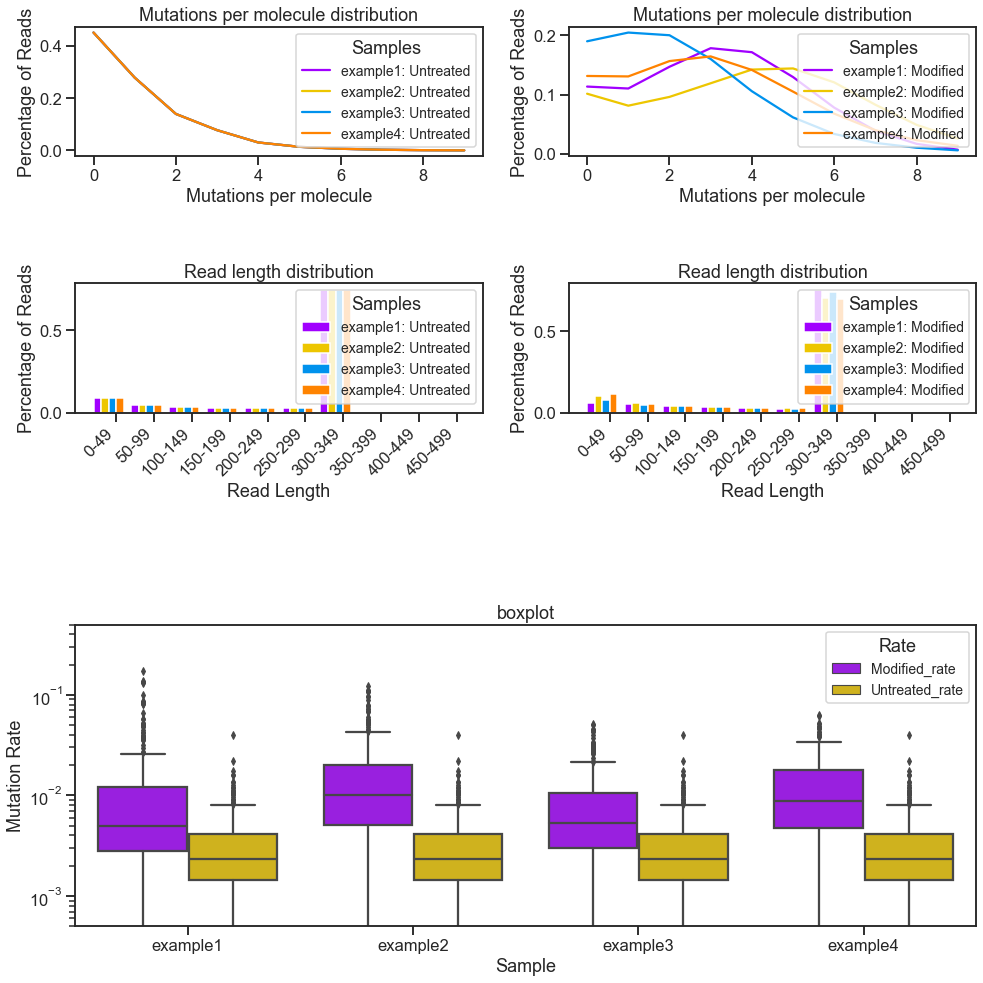

In [5]:
MaP.array_qc([example1, example2, example3, example4])

Classic ShapeMapper Plots
-------------------------
* make_shapemapper
  * plot_sm_profile
  * plot_sm_depth
  * plot_sm_rates

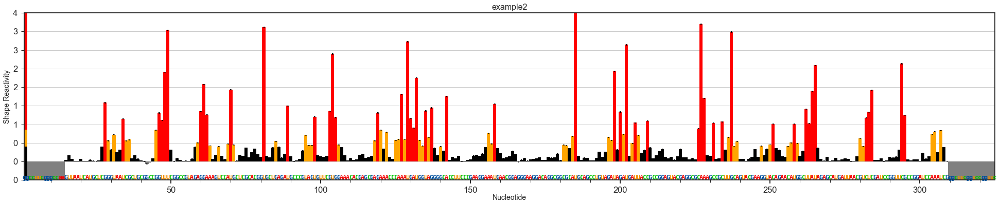

In [6]:
example2.plot_sm_profile()

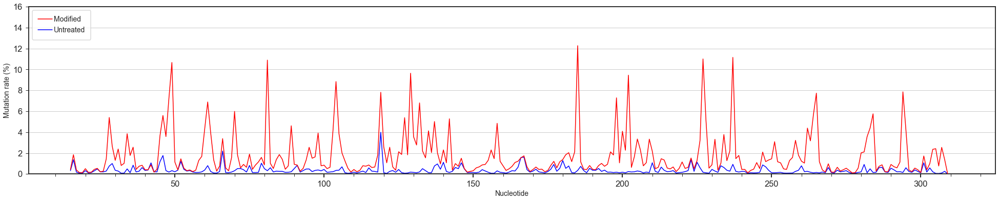

In [7]:
example2.plot_sm_rates()

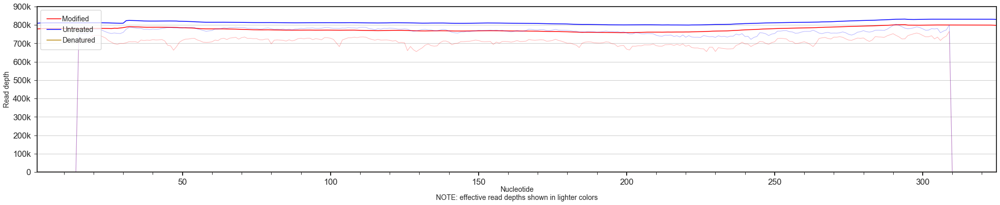

In [8]:
example2.plot_sm_depth()

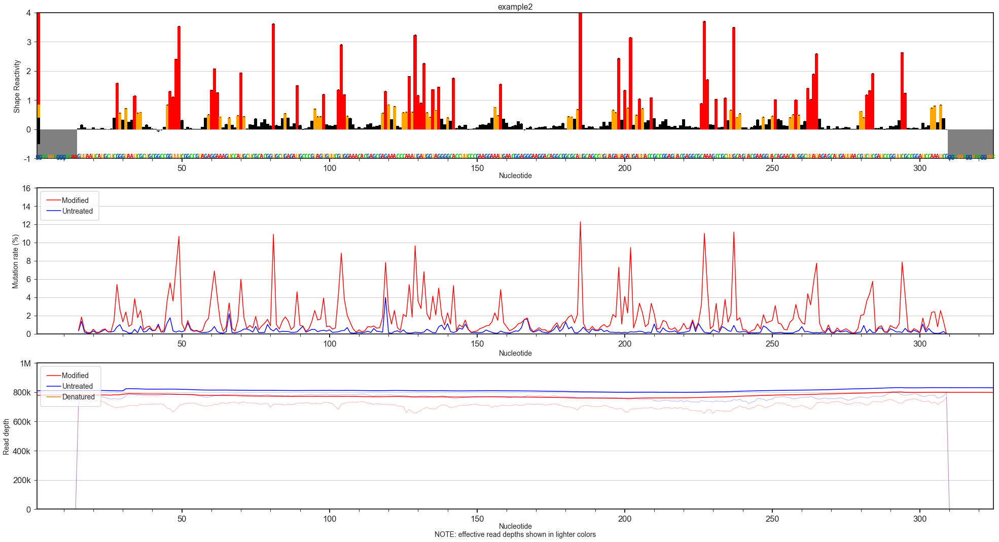

In [9]:
example2.make_shapemapper()

## Skyline Plots
* make_skyline
* make_dance_skyline
  * get_skyline_figsize
  * plot_skyline
  * plot_sequence
* array_skyline

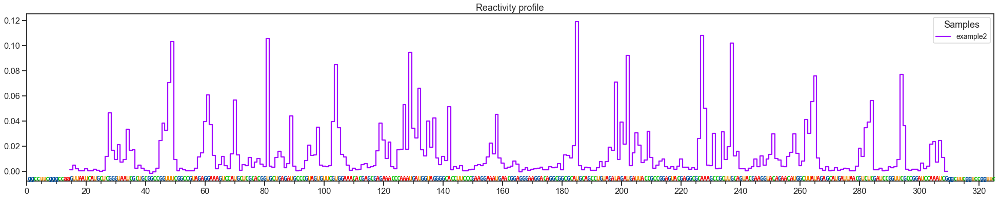

In [10]:
example2.make_skyline()

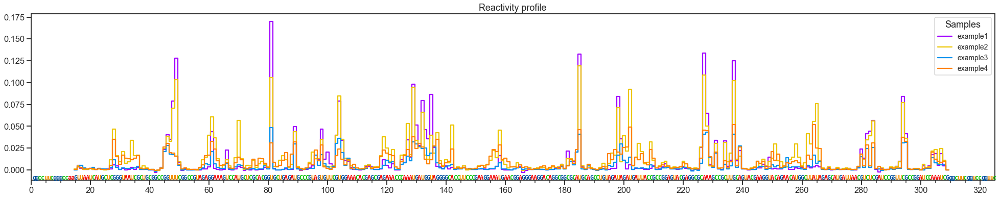

In [11]:
MaP.array_skyline([example1, example2, example3, example4])

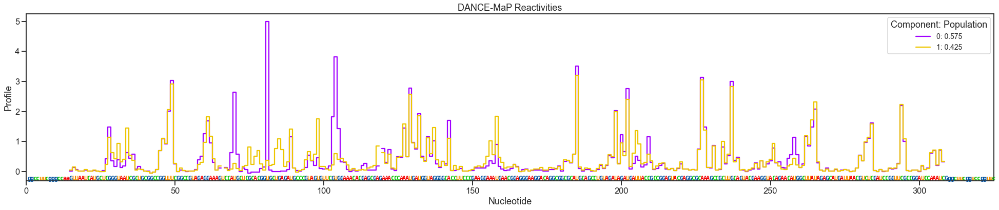

In [12]:
example2.make_dance_skyline()

In [13]:
plt.close('all')

## Heatmap and Contour Plots
* make_heatmap
  * get_distance_matrix (This is not speedy yet for contact distances.)
  * plot_contour_distances
  * plot_heatmap_data

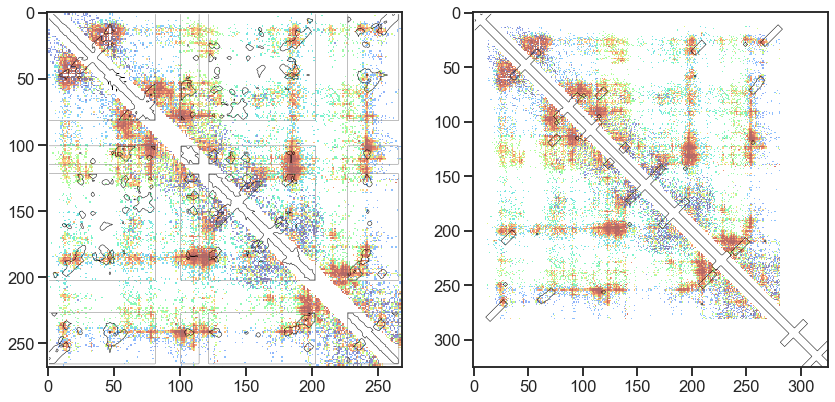

In [14]:
fig, ax = plt.subplots(1, 2, figsize=(14, 7))
example2.make_heatmap("deletions", "pdb", ax=ax[0])
example2.make_heatmap("deletions", "ct", ax=ax[1])

## Arc Plots
* make_ap
  * add_arc
  * get_ap_figsize
  * set_ap
  * plot_ap_ct
  * plot_ap_ctcompare
  * plot_ap_profile
  * plot_ap_data
* array_ap

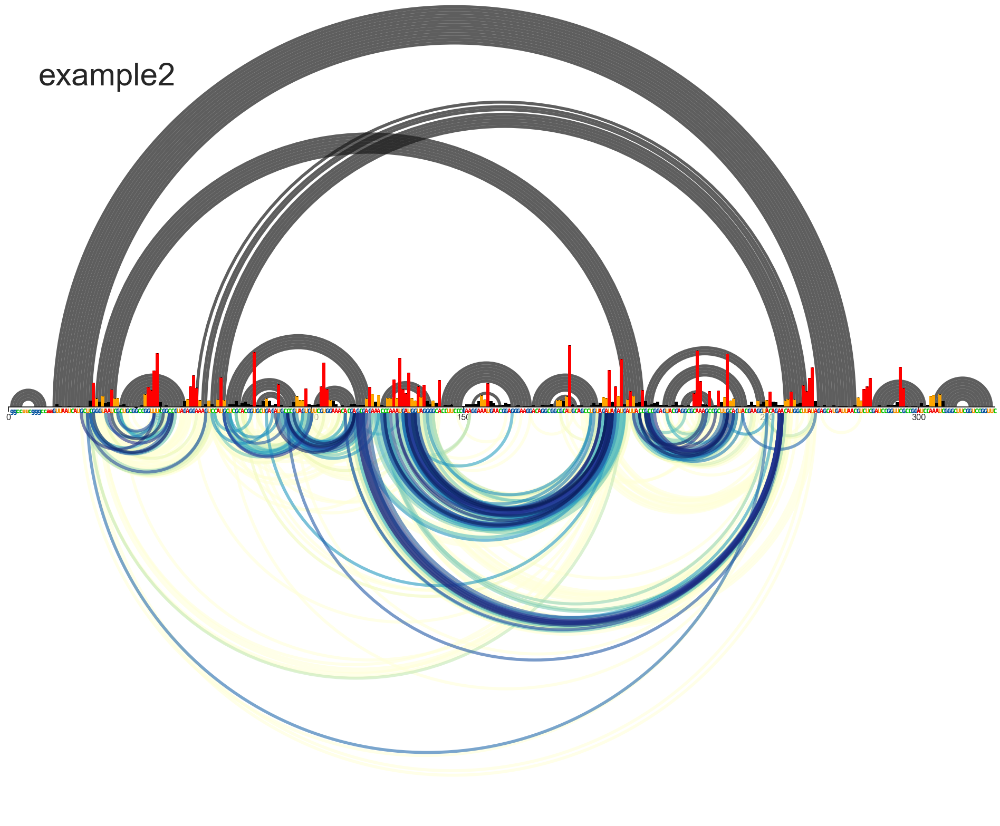

In [15]:
example2.make_ap(attribute="deletions", Percentile=0.95);

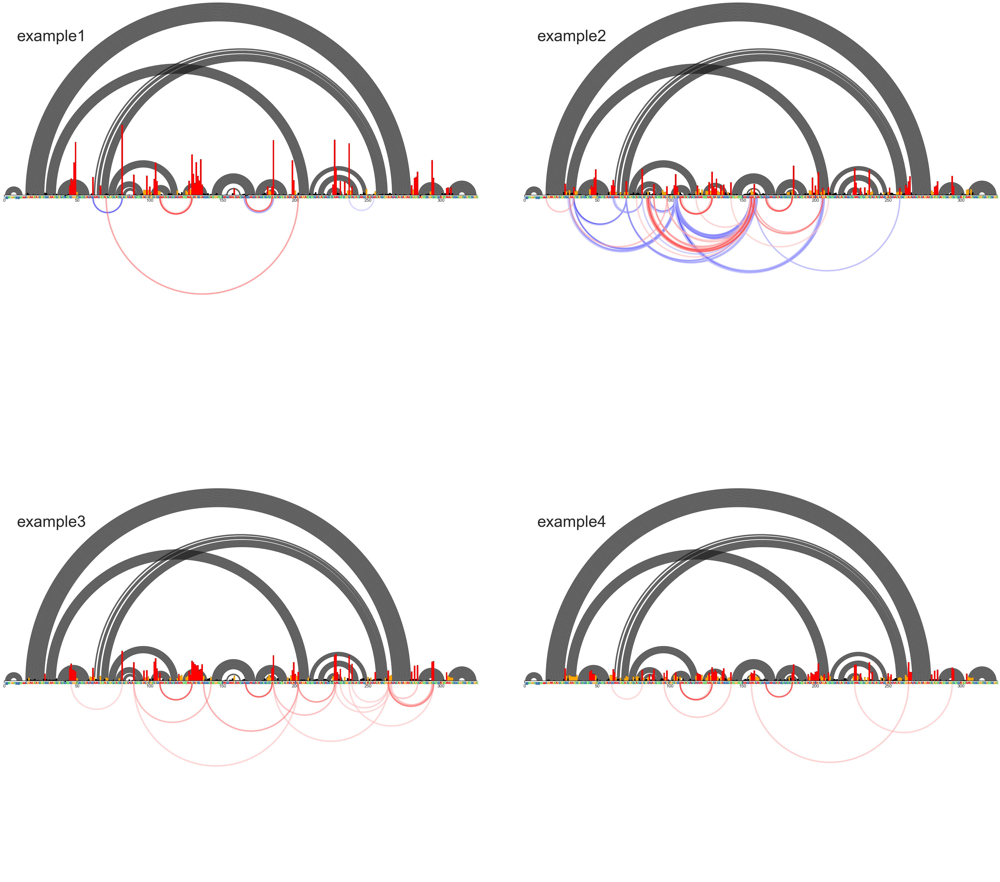

In [16]:
MaP.array_ap([example1, example2, example3, example4], attribute="rings", cdAbove=15)

## Secondary Structure - Single Sample

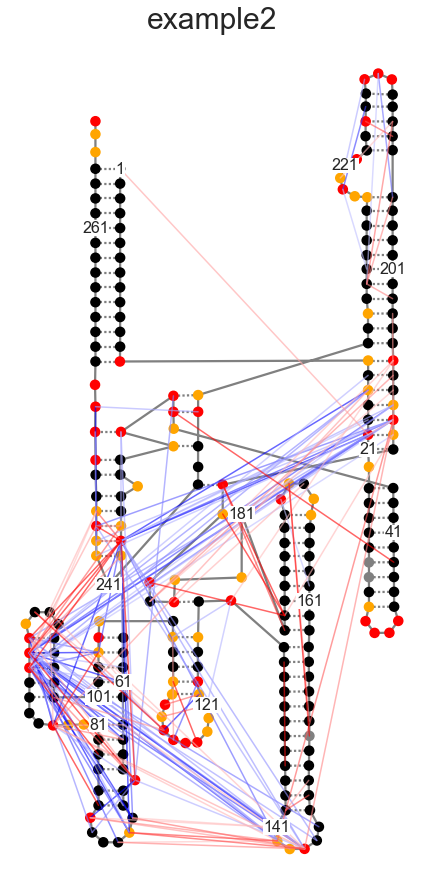

In [17]:
example2.make_ss(attribute="rings");

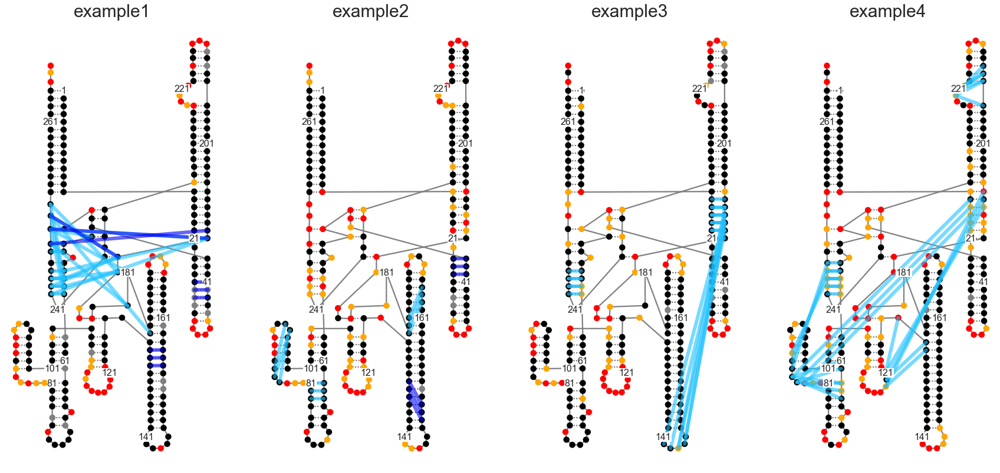

In [18]:
MaP.array_ss([example1, example2, example3, example4], attribute="pairs")

In [19]:
plt.close('all')

3D molecule interactive plots
-----------------------------
Controls:
* click and drag to rotate
* mouse scroll or right click to zoom
* 3rd mouse button and drag to pan


In [20]:
example2.make_3d(attribute="deletions", metric="Distance", Percentile=0.99).spin()

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

In [21]:
MaP.array_3d([example1, example2, example3, example4], attribute="rings", Statistic=15)

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

## Review
PlotMapper and Jupyter Notebooks provides a fast and easy way to explore MaP and JuMP data sets.
* Quality contol
* Skylines
* Arc Plots
* Heatmaps
* Secondary Structure
* 3D structure
* etc.

## To Do List:
* Create an installation guide and better documentation.
* Create a guide for modular use for advanced users.
* Improve look of figures, include more color bars, legends, and labels.
* I would also like to include other simple analyses in this module:
  * RNP-MaP
  * Minimum Log comparisons
  * deltaSHAPE
  * etc.

## What I need from the Weeks Lab
* Beta testing.
* Ideas for new ways of looking at data.
* Ideas for how to improve the look and readability of plots.
* New analyses might benefit by being built on-top of the MaP.Sample object.